# Deep Neural Network modeling 

### IMPORTANT NOTES: Please read below if you plan on executing this notebook

1. Please download the [GTZAN dataset from Kaggle](https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification?resource=download)
2. Since these are publicly avaiable audio datas amounting to over 1 GB, they are not part of the GitHub project.
4. Additional package installation (librosa, libsndfile) might be required, make sure those are installed in your dev environment
5. I am running this on my personal Macbook with M3 Pro CPU and have installed the apple driver for using GPU for training. On my machine, the spectrogram generation takes about 2 minutes and training takes about 8 minutes.
6. It is expected that without GPU, the spectrogram extraction might take upto 20 minutes and the model training may take upto 45 minutes or more. (It is highly recommended to do the model training with GPU)



## Theory of operation
To make the understanding of the below notebook easier, here is the theory of operations that are performed in this notebook.

1. First step is to convert the audio (.wav) files to spectrograms
       a. Spectrogram can be thought of as an image snapshot of audio data in the frequency domain, where the signal distribution w.r.t frequency is extracted from the audio waveform data
       b. Each audio in the dataset is of 30 sec duration.
       c. The parameters used for spectrogram extraction is 3 second windows
       d. This means each audio file will have 10 spectrogram images associated with it (3 second * 10 = 30 Second)
2. Converted spectrogram is stored on disk
        a. All the spectrogram files are stored on disk (about 10,000 png files will be created)
        b. The files are stores in the `Data/genres_spectrograms` folder
   Once we have the spectrogram, we are ready to create a model
4. The model architecture is to use a Convolutional Neural Network (the architecture of this will be shown below)
5. The model is trained as a image classifier (since spectrograms are images) and they are classified into labels (genres)
6. But for generating a music recommendation, we will not use the Softmax (last layer) of the model, rather we will capture the Vectors the model generates (learned features or weights) just before the last layer (label classification).
7. Once these vectors are obtained, we will use a simple KNN model to find the closest neighbor w.r.t to the models learned features.
8. We will split the dataset into 80% training and 20% Test (cross validation) sets
9. The training accuracy and validation accuracy are interpreted as below:

   | Training Accuracy | Test Accuracy | Interpretation |
   | :--- | :---: | ---: |
   | Low ( < 50%) | Low (< 50%) | Model did not learn enough and cannot do a good prediction |
   | Low ( < 50%) | High (> 70%) | Model is wrong, it is predicting correctly without learning|
   | High ( > 90%) | Low (< 40%) | Possible overfitting, Model learned training data too well, cannot differentiate test data|
   | High ( > 90%) | High (> 60%) | This is our target where model learns well and predicts well|
   


## Additional resources 
[Understanding the Mel Spectrogram](https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53)

In [19]:
import os
from joblib import Parallel, delayed
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import warnings
from tqdm import tqdm # Progress bar

In [20]:
# Suppress warnings
warnings.filterwarnings('ignore')

In [21]:
AUDIO_ROOT_FOLDER = "Data/genres_original"     
SPEC_OUTPUT_PATH = 'Data/genres_spectrograms'   
SAMPLE_RATE = 22050
DURATION = 30 # Original song length
SLICE_LEN = 3 # Split into 3-second chunks
SAMPLES_PER_SLICE = SAMPLE_RATE * SLICE_LEN

In [22]:
# Function to create spectrogram for each file 
def extract_spectrograms_per_file(audio_file_path, spec_save_path):
    try:
        y, sr = librosa.load(audio_file_path, sr=SAMPLE_RATE, duration=DURATION)
        num_slices = int(len(y) / SAMPLES_PER_SLICE)
        print(num_slices)
    
        for slice in range(num_slices):
            start = slice * SAMPLES_PER_SLICE
            end = start + SAMPLES_PER_SLICE
            slice_audio = y[start:end]
            
            # slice must be full length
            if len(slice_audio) != SAMPLES_PER_SLICE:
                continue
            
            # DSP: Mel-Spectrogram
            melspectrogram = librosa.feature.melspectrogram(
                y=slice_audio, sr=sr, n_mels=128, n_fft=2048, hop_length=512)
            log_mel = librosa.power_to_db(melspectrogram, ref=np.max)
    
            # --- SAVE IMAGE ---
            # No axes, no white borders, just data (we need clean data for the model)
            plt.figure(figsize=(0.72, 0.72)) 
            librosa.display.specshow(log_mel, sr=sr, hop_length=512)
            plt.axis('off')
            
            # Append _slice<number>.png to filename (ex: blues.0001_slice2.png)
            filename = os.path.basename(audio_file_path)
            base_name = filename.rsplit('.', 1)[0]
            image_name = f"{base_name}_slice{slice}.png"
            
            plt.savefig(os.path.join(spec_save_path, image_name), bbox_inches='tight', pad_inches=0)
            # Since we are in a loop and parallel processing, close is necessary
            # I was having some crashes and memory issues without the close
            plt.close()
        return
    except:
        # GTZAN has one file that is corrupted, and it will be skipped here.
        print(f"Error processing {audio_file_path}, skipped")
    

In [23]:
# This function is the same from our previous notebook used for data analysis. 3\
# Explored the options to re-use from the older notebook, but just copy - pasting here for simplicity
def get_all_file_tasks_per_genre(genre_dir_path):
    if not os.path.isdir(genre_dir_path):
        print(f"Provided path {genre_dir_path} is not a directory")
        return []

    genre_label = os.path.basename(genre_dir_path)
    spec_output_path = os.path.join(SPEC_OUTPUT_PATH, genre_label)
    if not os.path.exists(spec_output_path):
        os.mkdir(spec_output_path)
                 
    file_tasks = []
    for file in os.listdir(genre_dir_path):
        if os.path.isdir(file):
            continue # ignore sub-directories in genre if any
        if not file.endswith('.wav'):
            continue # skip files that are not wav audio files 

        file_path = os.path.join(genre_dir_path, file)
        file_tasks.append((file_path, spec_output_path))

    return file_tasks

In [24]:
# Copied from the data analysis notebook.
def get_genre_dirs():
    genre_dir_paths = []

    # Go through the top level folder and extract all directories into a list
    # The GTZAN dataset stores audio file per genre folder (ex: blues, classical, etc..) 
    for file in os.listdir(AUDIO_ROOT_FOLDER):
        file_path = os.path.join(AUDIO_ROOT_FOLDER, file)
        if os.path.isdir(file_path):
            genre_dir_paths.append(file_path)
        else:
            continue # if not directory, ignore the file.

    return genre_dir_paths

In [25]:
# Helper function to extract the spectrogram from audio files.  
# The logic around traversing files and parallelization is same as data_analysis notebook.
def extract_spectrograms_from_audios(parallel):
    """
    parallel - If true, the spectrogram extraction runs in parallel
    """
    print("Starting Spectrogram Extraction")
    #Create based output dir 
    if not os.path.exists(SPEC_OUTPUT_PATH):
        os.mkdir(SPEC_OUTPUT_PATH)
        print(f"Created directory {SPEC_OUTPUT_PATH} to save spectrograms per genre")
        
    genre_dir_paths = get_genre_dirs()
    
    valid_results = []
    for genre_dir in genre_dir_paths:
        tasks = get_all_file_tasks_per_genre(genre_dir)
        if len(tasks) == 0:
            continue

        results = []
        if parallel:
            print(f"Found {len(tasks)} for {genre_dir}. Starting parallel processing...")
            Parallel(n_jobs=-1, verbose=5)(
                delayed(extract_spectrograms_per_file)(path, out_path) for path, out_path in tasks)
        else:
            print(f"Found {len(tasks)} for {genre_dir}. Starting sequential processing...")
            count = 1
            for path, out_path in tasks:
                count = count + 1
                extract_spectrograms_per_file(path, out_path)
                if (count%10 == 0):
                    print(f"Done processing {count} files, continuing", end="", flush=True)

    print(f"Finished creating genre specific Spectrograms at {SPEC_OUTPUT_PATH}")


In [26]:
extract_spectrograms_from_audios(parallel=True)

Starting Spectrogram Extraction
Found 100 for Data/genres_original/pop. Starting parallel processing...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/metal. Starting parallel processing...


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/disco. Starting parallel processing...


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/blues. Starting parallel processing...


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/reggae. Starting parallel processing...


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/classical. Starting parallel processing...


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/rock. Starting parallel processing...


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/hiphop. Starting parallel processing...


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/country. Starting parallel processing...


[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


Found 100 for Data/genres_original/jazz. Starting parallel processing...


/var/folders/2d/_3zzzy7j0wv3swr8rqvqlnbm0000gn/T/ipykernel_4150/1223068746.py:4: UserWarning: PySoundFile failed. Trying audioread instead.
/opt/anaconda3/lib/python3.12/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.3s


Finished creating genre specific Spectrograms at Data/genres_spectrograms


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.3s finished


## Observations
Now we have generated all the mel spectrogram images from the audio files. 

Below is how the spectrogram looks. 

This is a tiny 128 x 128 image (zoomed to make it visible)

<img src="images/pop.00080_slice4.png" width="600" height="600" />

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
import matplotlib.pyplot as plt

# CONFIG
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 16
DATA_DIR = 'Data/genres_spectrograms'

def train_cnn_with_relu():
    tf.keras.backend.clear_session()
    
    # Check to print if GPU can be used.
    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
        print(f"GPU DETECTED: {gpus} (Using GPU for training)")
        try:
            # Currently, memory growth needs to be the same across GPUs
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            print("Memory growth enabled")
        except RuntimeError as e:
            # Memory growth must be set before GPUs have been initialized
            print(e)
    else:
        print("using CPU for training, might be slow")

    # 2. Load Data
    print("\nLoading Dataset...")
    # This works very well with the folder hierarchy we created.
    train_ds = tf.keras.utils.image_dataset_from_directory(
        DATA_DIR, 
        validation_split=0.2, 
        subset="training", 
        seed=123,
        image_size=(IMG_HEIGHT, IMG_WIDTH), 
        batch_size=BATCH_SIZE
    )
    
    val_ds = tf.keras.utils.image_dataset_from_directory(
        DATA_DIR, 
        validation_split=0.2, 
        subset="validation", 
        seed=123,
        image_size=(IMG_HEIGHT, IMG_WIDTH), 
        batch_size=BATCH_SIZE
    )

    # Prefetch seems to be necessary with GPU based training
    train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

    # 3. Model 
    model_cnn_with_relu = models.Sequential([
        # Rescale pixel values [0-255] -> [0-1]
        layers.Rescaling(1./255, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        
        # Convolutional Blocks with relu
        layers.Conv2D(32, 3, activation='relu'),
        layers.MaxPooling2D(),
        
        layers.Conv2D(64, 3, activation='relu'),
        layers.MaxPooling2D(),
        
        layers.Conv2D(128, 3, activation='relu'),
        layers.MaxPooling2D(),
        
        layers.Flatten(),
        
        # This is the layer we will extract later for recommendations
        layers.Dense(256, activation='relu', name='feature_embedding'),
        layers.Dropout(0.5),
        
        # Output Layer
        layers.Dense(10, activation='softmax')
    ])

    model_cnn_with_relu.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    model_cnn_with_relu.summary()

    # 4. Train
    print("\nStarting Training...")
    history = model_cnn_with_relu.fit(
        train_ds,
        validation_data=val_ds,
        epochs=15, 
        callbacks=[
            # Stop if validation loss stops improving for 3 epochs
            callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
        ]
    )
    
    # Save the model so the next cell can load it
    model_cnn_with_relu.save('model_cnn_with_relu.keras')
    print("Model saved to model_cnn_with_relu.keras")
    
    return model_cnn_with_relu, history


In [2]:
# Lets train the model.
model_cnn_with_relu, history_cnn_with_relu = train_cnn_with_relu()

GPU DETECTED: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')] (Using GPU for training)
✅ Memory growth enabled

Loading Dataset...
Found 9981 files belonging to 10 classes.
Using 7985 files for training.


2025-11-25 09:56:49.474427: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2025-11-25 09:56:49.474455: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2025-11-25 09:56:49.474462: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2025-11-25 09:56:49.474480: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-11-25 09:56:49.474497: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Found 9981 files belonging to 10 classes.
Using 1996 files for validation.


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/preprocessing/data_layer.py:95: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ feature_embedding (Dense)       │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,518,602 (24.87 MB)

 Trainable params: 6,518,602 (24.87 MB)

 Non-trainable params: 0 (0.00 B)


Starting Training...
Epoch 1/15


2025-11-25 09:56:50.018855: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


500/500 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.2791 - loss: 1.9594 - val_accuracy: 0.4033 - val_loss: 1.5810
Epoch 2/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.3964 - loss: 1.6435 - val_accuracy: 0.5080 - val_loss: 1.3320
Epoch 3/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.4793 - loss: 1.4766 - val_accuracy: 0.4930 - val_loss: 1.3361
Epoch 4/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.5344 - loss: 1.3936 - val_accuracy: 0.5311 - val_loss: 1.3853
Epoch 5/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5537 - loss: 1.3855 - val_accuracy: 0.5937 - val_loss: 1.3075
Epoch 6/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.5728 - loss: 1.4148 - val_accuracy: 0.6097 - val_loss: 1.1634
Epoch 7/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.5832 - loss: 1.4495 - val_accuracy: 0.6107 - val_loss: 1.2612
Epoch 8/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5896 - loss: 1.6460 - val_accurac

In [7]:
def plot_history(history):
    """
    Plots the Training vs Validation Accuracy and Loss side-by-side.
    """
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # Plot 1: Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy', linestyle='--')
    plt.legend(loc='lower right')
    plt.title('Accuracy: Training vs Validation')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')

    # Plot 2: Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss', linestyle='--')
    plt.legend(loc='upper right')
    plt.title('Loss: Training vs Validation')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    
    plt.show()
    return None

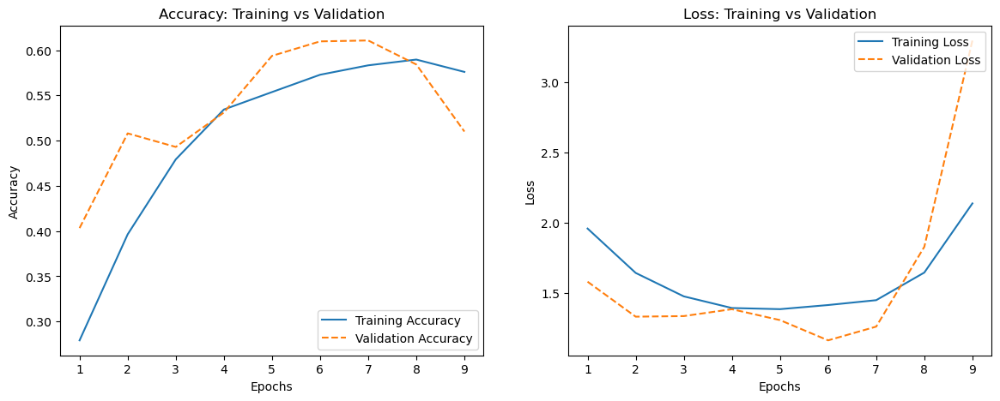

In [5]:
plot_history(history_cnn_with_relu)

## Observations 

1. Unfortunately, the cnn model with relu activation does not seem to be good enough as per our criteria listed earlier
2. The training  accuracy peaks at under 60%
3. The test accuracy is hardly 60%

This means that the model hasn't really learned the spectrograms well and also cannot classify the test set well. 

Next, we will do more experimentation to see if we can improve this.

## Next step

After some reading up and researching, I have found that probably relu is not a good activation function for this model. There are research papers that are suggesting to use `elu` activation function.

So, next step is to try the same model with `elu` activation


In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks

# CONFIG
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 16
DATA_DIR = 'Data/genres_spectrograms'

def train_cnn_elu():
    print("Starting Training of CNN with ELU model.")

    tf.keras.backend.clear_session()
    
    # Check to print if GPU can be used.
    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
        print(f"GPU DETECTED: {gpus} (Using GPU for training)")
        try:
            # Currently, memory growth needs to be the same across GPUs
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            print("Memory growth enabled")
        except RuntimeError as e:
            # Memory growth must be set before GPUs have been initialized
            print(e)
    else:
        print("using CPU for training, might be slow")
    
    # Load Data
    train_ds = tf.keras.utils.image_dataset_from_directory(
        DATA_DIR, validation_split=0.2, subset="training", seed=123,
        image_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=BATCH_SIZE
    )
    val_ds = tf.keras.utils.image_dataset_from_directory(
        DATA_DIR, validation_split=0.2, subset="validation", seed=123,
        image_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=BATCH_SIZE
    )
    
     # Prefetch seems to be necessary with GPU based training
    train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

    model = models.Sequential([
        layers.Rescaling(1./255, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        
        # Conv Block 1
        layers.Conv2D(32, 3, padding='same'),
        layers.BatchNormalization(), # Forces variance
        layers.Activation('elu'),    # Prevents dead zeros
        layers.MaxPooling2D(),
        
        # Conv Block 2
        layers.Conv2D(64, 3, padding='same'),
        layers.BatchNormalization(),
        layers.Activation('elu'),
        layers.MaxPooling2D(),
        
        # Conv Block 3
        layers.Conv2D(128, 3, padding='same'),
        layers.BatchNormalization(),
        layers.Activation('elu'),
        layers.MaxPooling2D(),
        
        layers.Flatten(),
        
        # Embedding Layer (The Neck)
        layers.Dense(256, name='feature_embedding'),
        layers.BatchNormalization(), # 
        layers.Activation('elu'), 
        layers.Dropout(0.5),
        
        # Head
        layers.Dense(10, activation='softmax')
    ])

    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    model.summary()
    
    # Train
    history = model.fit(
        train_ds, validation_data=val_ds, epochs=15, 
        callbacks=[callbacks.EarlyStopping(patience=3, restore_best_weights=True)]
    )
    
    # Save the model so the next cell can load it
    model.save('model_elu.keras')
    print("Model saved to model_elu.keras")
    
    return model, history



In [2]:
model_elu, history_elu = train_cnn_elu()


Starting Training of CNN with ELU model.
GPU DETECTED: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')] (Using GPU for training)
Memory growth enabled
Found 9981 files belonging to 10 classes.
Using 7985 files for training.


2025-11-25 10:47:55.742015: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2025-11-25 10:47:55.742043: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2025-11-25 10:47:55.742049: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2025-11-25 10:47:55.742067: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-11-25 10:47:55.742079: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Found 9981 files belonging to 10 classes.
Using 1996 files for validation.


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/preprocessing/data_layer.py:95: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ feature_embedding (Dense)       │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,486,602 (32.37 MB)

 Trainable params: 8,485,642 (32.37 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/15


2025-11-25 10:47:56.500596: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


500/500 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.5425 - loss: 1.4080 - val_accuracy: 0.4294 - val_loss: 2.2234
Epoch 2/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.7306 - loss: 0.8077 - val_accuracy: 0.5862 - val_loss: 1.2783
Epoch 3/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8205 - loss: 0.5214 - val_accuracy: 0.6227 - val_loss: 1.1923
Epoch 4/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8837 - loss: 0.3398 - val_accuracy: 0.6533 - val_loss: 1.1775
Epoch 5/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.9279 - loss: 0.2120 - val_accuracy: 0.4579 - val_loss: 2.3589
Epoch 6/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.9400 - loss: 0.1808 - val_accuracy: 0.6528 - val_loss: 1.2633
Epoch 7/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.9499 - loss: 0.1539 - val_accuracy: 0.7119 - val_loss: 1.1332
Epoch 8/15
500/500 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9612 - loss: 0.1165 - val_accurac

In [8]:
import numpy as np

def print_best_model_stats(history):
    # 1. Find the index of the best model (min validation loss)
    # This matches the logic EarlyStopping used.
    best_epoch_idx = np.argmin(history.history['val_loss'])
    
    # 2. Extract values
    best_train_acc = history.history['accuracy'][best_epoch_idx]
    best_train_loss = history.history['loss'][best_epoch_idx]
    best_val_acc = history.history['val_accuracy'][best_epoch_idx]
    best_val_loss = history.history['val_loss'][best_epoch_idx]
    
    # 3. Print
    print(f"Best Model Selected from Epoch {best_epoch_idx + 1}")
    print("-" * 30)
    print(f"Training Accuracy:   {best_train_acc:.2%}")
    print(f"Training Loss:       {best_train_loss:.4f}")
    print(f"Validation Accuracy: {best_val_acc:.2%}")
    print(f"Validation Loss:     {best_val_loss:.4f}")

# Run it
print_best_model_stats(history_elu)

Best Model Selected from Epoch 7
------------------------------
Training Accuracy:   94.99%
Training Loss:       0.1539
Validation Accuracy: 71.19%
Validation Loss:     1.1332


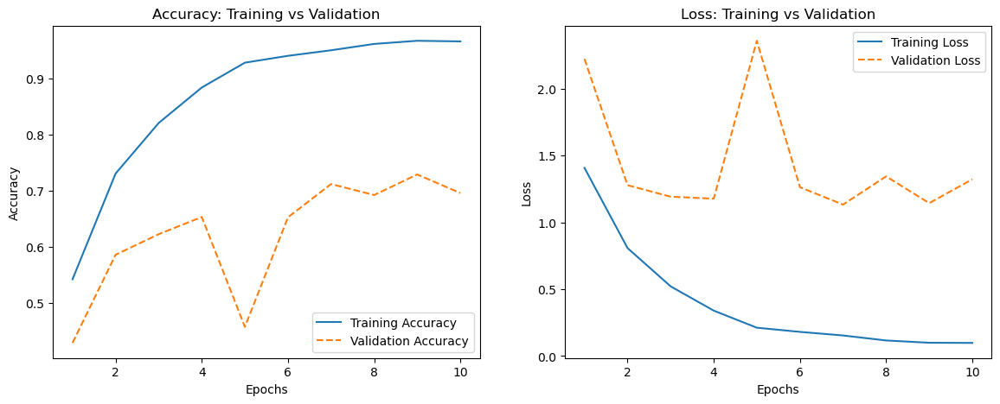

In [11]:
plot_history(history_elu)


## observations 

1. After several trial and errors, the final model that is acceptable uses 'elu' activation with Batch Normalization
2. Also, during the training stage, we asked the training to stop if the loss increased for 3 consecutive epochs.
3. The best model chosen here is from Epoch 4  with Training Accuracy of 94.99%% and Test accuracy of 71.19%
4. This is probably a good model without overfitting and still predicting unseen audio features.

### Next step 
As the goal of the project is to build a recommendation system and not a classifier, the next steps are to 
1. Remove the last layer of the model
2. Obtain the learned feature vectors
3. Do a KNN on the learned feature vectors to actually get recommendataions.


In [12]:
import numpy as np
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from sklearn.neighbors import NearestNeighbors
from tqdm import tqdm

# CONFIG
IMG_HEIGHT = 128
IMG_WIDTH = 128
DATA_DIR = 'Data/genres_spectrograms'

from tensorflow.keras.models import Sequential

def build_dl_recommender(trained_model):
    print("Building Index")

    # Create a new model using the trained layers
    # We take all layers except the last one (Dense 10 / Softmax)
    extractor = Sequential(trained_model.layers[:-1])
    
    # Verify we have the right output shape (Should be 256)
    # We pass a dummy input to read shape
    dummy_input = np.zeros((1, 128, 128, 3))
    output_shape = extractor(dummy_input).shape
    print(f"Extractor ready. Output vector shape: {output_shape}")

    # Vectorize all songs
    print("Generating embeddings...")
    vectors = []
    metadata = []
    
    genres = sorted([d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))])
    
    for genre in genres:
        genre_dir = os.path.join(DATA_DIR, genre)
        song_map = {}
        for f in os.listdir(genre_dir):
            if f.endswith('.png'):
                base = os.path.splitext(f)[0]
                if '_slice' in base: sid = base.split('_slice')[0]
                elif '.slice' in base: sid = base.split('.slice')[0]
                else: sid = base.rsplit('.', 1)[0]
                song_map.setdefault(sid, []).append(os.path.join(genre_dir, f))
        
        for song_id, paths in tqdm(song_map.items(), desc=f"Indexing {genre}", leave=True):
            slice_vecs = []
            for p in paths:
                try:
                    img = image.load_img(p, target_size=(IMG_HEIGHT, IMG_WIDTH))
                    arr = image.img_to_array(img)
                    arr = np.expand_dims(arr, axis=0)
                    # arr /= 255.0 # This was a bug that took a while to debug, the model already does rescaling, we should not do again here.
                    
                    vec = extractor.predict(arr, verbose=0)
                    slice_vecs.append(vec[0])
                except:
                    continue
            
            if slice_vecs:
                avg_vec = np.mean(slice_vecs, axis=0)
                vectors.append(avg_vec)
                metadata.append({'filename': f"{song_id}.wav", 'genre': genre})

    if not vectors:
        print("No vectors generated.")
        return None

    # 3. BUILD INDEX
    X = np.array(vectors)
    knn = NearestNeighbors(n_neighbors=5, metric='cosine')
    knn.fit(X)
    
    df_meta = pd.DataFrame(metadata)
    print(f" Index built! {len(df_meta)} songs indexed.")
    
    return knn, df_meta, X, extractor

In [13]:
dl_knn, dl_meta, dl_features, dl_extractor = build_dl_recommender(model_elu)

Building Index
Extractor ready. Output vector shape: (1, 256)
Generating embeddings...


Indexing rock: 100%|██████████████████████████| 100/100 [00:25<00:00,  3.96it/s]

 Index built! 999 songs indexed.


In [14]:
from IPython.display import Audio, display

def recommend_dl(song_index):
    # Get Query
    query_vec = dl_features[song_index].reshape(1, -1)
    distances, indices = dl_knn.kneighbors(query_vec)
    
    # Play Query
    q_row = dl_meta.iloc[song_index]
    print(f"DL Query: {q_row['filename']} ({q_row['genre']})")
    
    q_path = f"./Data/genres_original/{q_row['genre']}/{q_row['filename']}"
    if os.path.exists(q_path): display(Audio(filename=q_path))
    
    print("-" * 40)
    
    # Play Recommendations
    for i in range(1, len(indices[0])):
        idx = indices[0][i]
        dist = distances[0][i]
        row = dl_meta.iloc[idx]
        
        print(f"Rec #{i}: {row['filename']}")
        print(f"       Genre: {row['genre']} | Cosine Dist: {dist:.4f}")
        
        r_path = f"./Data/genres_original/{row['genre']}/{row['filename']}"
        if os.path.exists(r_path): display(Audio(filename=r_path))
        print("\n")


recommend_dl(50)

DL Query: blues.00006.wav (blues)


----------------------------------------
Rec #1: blues.00007.wav
       Genre: blues | Cosine Dist: 0.0818




Rec #2: blues.00085.wav
       Genre: blues | Cosine Dist: 0.0987




Rec #3: blues.00019.wav
       Genre: blues | Cosine Dist: 0.1052




Rec #4: blues.00086.wav
       Genre: blues | Cosine Dist: 0.1065


## Observations 
It seems the model is doing very well. Given a blues track, it finds all other blues track that are acoustically similar without using any metadata or label classification


In [15]:
import librosa
import numpy as np
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from IPython.display import Audio, display

def test_external_song(filepath): 
    # 1. Load Audio
    try:
        y, sr = librosa.load(filepath, sr=22050, duration=30)
    except Exception as e:
        print(f"Error loading file: {e}")
        return

    # 2. Generate Temp Spectrogram Slices
    temp_dir = './temp_inference'
    os.makedirs(temp_dir, exist_ok=True)
    # Clean old temp files
    for f in os.listdir(temp_dir): os.remove(os.path.join(temp_dir, f))

    slice_len_samples = 22050 * 3 
    num_slices = int(len(y) / slice_len_samples)
    
    print(f"Generated {num_slices} visual slices.")

    slice_vectors = []
    
    for s in range(num_slices):
        start = s * slice_len_samples
        end = start + slice_len_samples
        slice_audio = y[start:end]
        
        if len(slice_audio) != slice_len_samples: continue

        # Mel-Spectrogram
        melspectrogram = librosa.feature.melspectrogram(
            y=slice_audio, sr=sr, n_mels=128, n_fft=2048, hop_length=512
        )
        log_mel = librosa.power_to_db(melspectrogram, ref=np.max)

        # Save Temp Image
        plt.figure(figsize=(0.72, 0.72))
        librosa.display.specshow(log_mel, sr=sr, hop_length=512)
        plt.axis('off')
        
        temp_img_path = os.path.join(temp_dir, f"temp_{s}.png")
        plt.savefig(temp_img_path, bbox_inches='tight', pad_inches=0)
        plt.close()
        
        # 3. Extract Embedding immediately
        img = image.load_img(temp_img_path, target_size=(128, 128))
        arr = image.img_to_array(img)
        arr = np.expand_dims(arr, axis=0)
        
        # Use the global extractor
        vec = dl_extractor.predict(arr, verbose=0)
        slice_vectors.append(vec[0])

    # 4. Average & Search
    if not slice_vectors:
        print("Could not generate vectors.")
        return

    avg_vector = np.mean(slice_vectors, axis=0).reshape(1, -1)
    distances, indices = dl_knn.kneighbors(avg_vector)
    
    # 5. Show Results
    print(f"RECOMMENDATIONS FOR: {os.path.basename(filepath)}")
    print("-" * 40)
    
    for i in range(0, len(indices[0])): 
        idx = indices[0][i]
        dist = distances[0][i]
        rec_row = dl_meta.iloc[idx]
        
        print(f"Rec #{i+1}: {rec_row['filename']}")
        print(f"       Genre: {rec_row['genre']} | Dist: {dist:.4f}")
        
        path = f"./Data/genres_original/{rec_row['genre']}/{rec_row['filename']}"
        if os.path.exists(path): display(Audio(filename=path))
        print("\n")

In [18]:
print("External song hindi_test_30sec.wav")
display(Audio("hindi_test_30sec.wav"))

test_external_song("hindi_test_30sec.wav")

External song hindi_test_30sec.wav


Generated 10 visual slices.
RECOMMENDATIONS FOR: hindi_test_30sec.wav
----------------------------------------
Rec #1: pop.00073.wav
       Genre: pop | Dist: 0.0831




Rec #2: pop.00042.wav
       Genre: pop | Dist: 0.0891




Rec #3: pop.00074.wav
       Genre: pop | Dist: 0.0929




Rec #4: pop.00019.wav
       Genre: pop | Dist: 0.0947




Rec #5: pop.00035.wav
       Genre: pop | Dist: 0.0960


## Observations 

This is the true test of the language agnostic nature of the system.
Providing a song in a language the model has never seen (in the test above it is a hindi song). Note that the training dataset and hence our index does not contain any hindi song. 

The model is perfectly matching the acoustic nature of the hindi song to pop and the best of all experience is that the audios sound so naturally similar 

Finally we have provied that a completely audio content based system will be able to effectively recommend music that is language agnostic without any metadata about the tracks!!! 
